# Eigenvector Visualization: Top 5 Positive and Negative

This notebook visualizes the top 5 positive (largest) and top 5 negative (smallest) eigenvectors for each MNIST class across different CP initialization modes.

## Research Question
How do different CP initialization modes (fixed, lambda, gated) affect the learned eigenvectors? Do they capture different interpretable features?


## 1. Setup


In [14]:
import sys
sys.path.insert(0, '..')

import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from src.plot_utils.cp import (
    get_top_eigenvectors,
    plot_eigenvector_grid,
    visualize_top_eigenvectors,
)

CP_CHECKPOINT_DIR = Path("../results/phase2/checkpoints")
FIGURE_DIR = Path("../results/phase2/figures")
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

# Configuration
RANKS = [8, 16, 32, 64, 128, 256, 784]
MODES = ['fixed', 'lambda', 'gated']
SEED = 42
N_TOP = 5
N_BOTTOM = 5


## 2. Load Checkpoints and Extract Eigenvectors


In [15]:
# Load all checkpoints
checkpoint_data = {}

for rank in RANKS:
    for mode in MODES:
        path = CP_CHECKPOINT_DIR / f"mnist_cp_r{rank}_{mode}_seed{SEED}.pt"
        if path.exists():
            checkpoint_data[(rank, mode)] = torch.load(path, map_location='cpu', weights_only=False)
            print(f"✓ Loaded: R={rank}, Mode={mode}")
        else:
            print(f"✗ Missing: R={rank}, Mode={mode}")

print(f"\nLoaded {len(checkpoint_data)}/{len(RANKS) * len(MODES)} checkpoints")


✓ Loaded: R=8, Mode=fixed
✓ Loaded: R=8, Mode=lambda
✓ Loaded: R=8, Mode=gated
✓ Loaded: R=16, Mode=fixed
✓ Loaded: R=16, Mode=lambda
✓ Loaded: R=16, Mode=gated
✓ Loaded: R=32, Mode=fixed
✓ Loaded: R=32, Mode=lambda
✓ Loaded: R=32, Mode=gated
✓ Loaded: R=64, Mode=fixed
✓ Loaded: R=64, Mode=lambda
✓ Loaded: R=64, Mode=gated
✓ Loaded: R=128, Mode=fixed
✓ Loaded: R=128, Mode=lambda
✓ Loaded: R=128, Mode=gated
✓ Loaded: R=256, Mode=fixed
✓ Loaded: R=256, Mode=lambda
✓ Loaded: R=256, Mode=gated
✓ Loaded: R=784, Mode=fixed
✓ Loaded: R=784, Mode=lambda
✓ Loaded: R=784, Mode=gated

Loaded 21/21 checkpoints


## 2.1 Summary Table: Accuracy and Effective Rank


In [16]:
import pandas as pd
from src.analysis.spectral import effective_rank

# Create summary table
summary_data = []

for rank in RANKS:
    for mode in MODES:
        key = (rank, mode)
        if key in checkpoint_data:
            checkpoint = checkpoint_data[key]
            metrics = checkpoint['metrics']
            eigenvalues = checkpoint['eigenvalues']
            
            # Get accuracy and effective rank
            val_acc = metrics.get('val_acc', metrics.get('test_acc', 0.0))
            eff_rank = metrics.get('effective_rank', effective_rank(eigenvalues).mean().item())
            
            summary_data.append({
                'Rank': rank,
                'Mode': mode,
                'Accuracy': val_acc,
                'Effective Rank': eff_rank
            })

# Create DataFrame and sort by rank, then mode
summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values(['Rank', 'Mode']).reset_index(drop=True)

# Display formatted table
print("Summary of CP Mode Sweep Results")
print("=" * 60)
display(summary_df.style.format({
    'Accuracy': '{:.4f}',
    'Effective Rank': '{:.2f}'
}))

# Create pivot tables for easier comparison (keep numeric for sorting)
pivot_acc = summary_df.pivot(index='Rank', columns='Mode', values='Accuracy')
pivot_effrank = summary_df.pivot(index='Rank', columns='Mode', values='Effective Rank')

print("\n" + "=" * 60)
print("Accuracy by Rank and Mode")
print("=" * 60)
display(pivot_acc.style.format('{:.4f}'))

print("\n" + "=" * 60)
print("Effective Rank by Rank and Mode")
print("=" * 60)
display(pivot_effrank.style.format('{:.2f}'))


Summary of CP Mode Sweep Results


,Rank,Mode,Accuracy,Effective Rank
0,8,fixed,0.8732,3.38
1,8,gated,0.9145,5.66
2,8,lambda,0.9210,6.44
3,16,fixed,0.8941,3.13
4,16,gated,0.9241,6.94
5,16,lambda,0.9232,7.68
6,32,fixed,0.9023,3.37
7,32,gated,0.9262,8.91
8,32,lambda,0.9274,8.65
9,64,fixed,0.9108,3.44



Accuracy by Rank and Mode


Mode,fixed,gated,lambda
Rank,,,
8,0.8732,0.9145,0.9210
16,0.8941,0.9241,0.9232
32,0.9023,0.9262,0.9274
64,0.9108,0.9319,0.9312
128,0.9160,0.9330,0.9342
256,0.9173,0.9388,0.9390
784,0.9248,0.9474,0.9461



Effective Rank by Rank and Mode


Mode,fixed,gated,lambda
Rank,,,
8,3.38,5.66,6.44
16,3.13,6.94,7.68
32,3.37,8.91,8.65
64,3.44,11.65,11.05
128,3.69,14.58,14.83
256,3.69,17.86,16.90
784,4.34,19.04,18.63


## 3. Visualize Top 5 Positive and Negative Eigenvectors

For each (rank, mode) combination, we'll visualize:
- **Top 5 Positive**: The 5 eigenvectors with the largest eigenvalues (most important positive directions)
- **Top 5 Negative**: The 5 eigenvectors with the smallest eigenvalues (most important negative directions)


In [17]:
def visualize_eigenvectors_for_config(rank, mode, checkpoint_data, n_top=5, n_bottom=5):
    """Visualize top and bottom eigenvectors for a specific (rank, mode) configuration."""
    key = (rank, mode)
    if key not in checkpoint_data:
        print(f"Checkpoint not found for R={rank}, Mode={mode}")
        return
    
    checkpoint = checkpoint_data[key]
    eigenvalues = checkpoint['eigenvalues']  # [10, 784]
    eigenvectors = checkpoint['eigenvectors']  # [10, 784, 784]
    
    # Extract top and bottom eigenvectors
    top_indices, top_vecs, bottom_indices, bottom_vecs = get_top_eigenvectors(
        eigenvalues, eigenvectors, n_top=n_top, n_bottom=n_bottom
    )
    
    # Create figure: 10 classes × (n_top + n_bottom) eigenvectors
    fig, axes = plt.subplots(10, n_top + n_bottom, figsize=(2 * (n_top + n_bottom), 20))
    
    # Find global vmin/vmax for consistent scaling
    vmax = max(top_vecs.abs().max().item(), bottom_vecs.abs().max().item())
    vmin = -vmax
    
    for class_idx in range(10):
        # Plot top eigenvectors (positive)
        for i in range(n_top):
            ax = axes[class_idx, i]
            vec = top_vecs[class_idx, i].detach().cpu().numpy().reshape(28, 28)
            ax.imshow(vec, cmap='RdBu', vmin=vmin, vmax=vmax)
            ax.axis('off')
            
            # Add eigenvalue label
            eig_val = eigenvalues[class_idx, top_indices[class_idx, i]].item()
            ax.set_title(f'{eig_val:.2f}', fontsize=8, pad=2)
            
            # Add class label on first column
            if i == 0:
                ax.set_ylabel(f'Class {class_idx}', fontsize=10, rotation=0, ha='right', va='center')
        
        # Plot bottom eigenvectors (negative)
        for i in range(n_bottom):
            ax = axes[class_idx, n_top + i]
            vec = bottom_vecs[class_idx, i].detach().cpu().numpy().reshape(28, 28)
            ax.imshow(vec, cmap='RdBu', vmin=vmin, vmax=vmax)
            ax.axis('off')
            
            # Add eigenvalue label
            eig_val = eigenvalues[class_idx, bottom_indices[class_idx, i]].item()
            ax.set_title(f'{eig_val:.2f}', fontsize=8, pad=2)
    
    # Add column headers
    for i in range(n_top):
        axes[0, i].text(0.5, 1.15, f'Top {i+1}', transform=axes[0, i].transAxes,
                       ha='center', fontsize=10, fontweight='bold')
    for i in range(n_bottom):
        axes[0, n_top + i].text(0.5, 1.15, f'Bottom {i+1}', transform=axes[0, n_top + i].transAxes,
                               ha='center', fontsize=10, fontweight='bold')
    
    plt.suptitle(f'Top {n_top} Positive and Top {n_bottom} Negative Eigenvectors\n'
                f'CP R={rank}, Mode={mode}', 
                fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout(rect=(0, 0, 1, 0.99))
    
    # Save figure
    save_path = FIGURE_DIR / f'eigenvectors_r{rank}_{mode}.pdf'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()


Saved: ../results/phase2/figures/eigenvectors_r32_gated.pdf


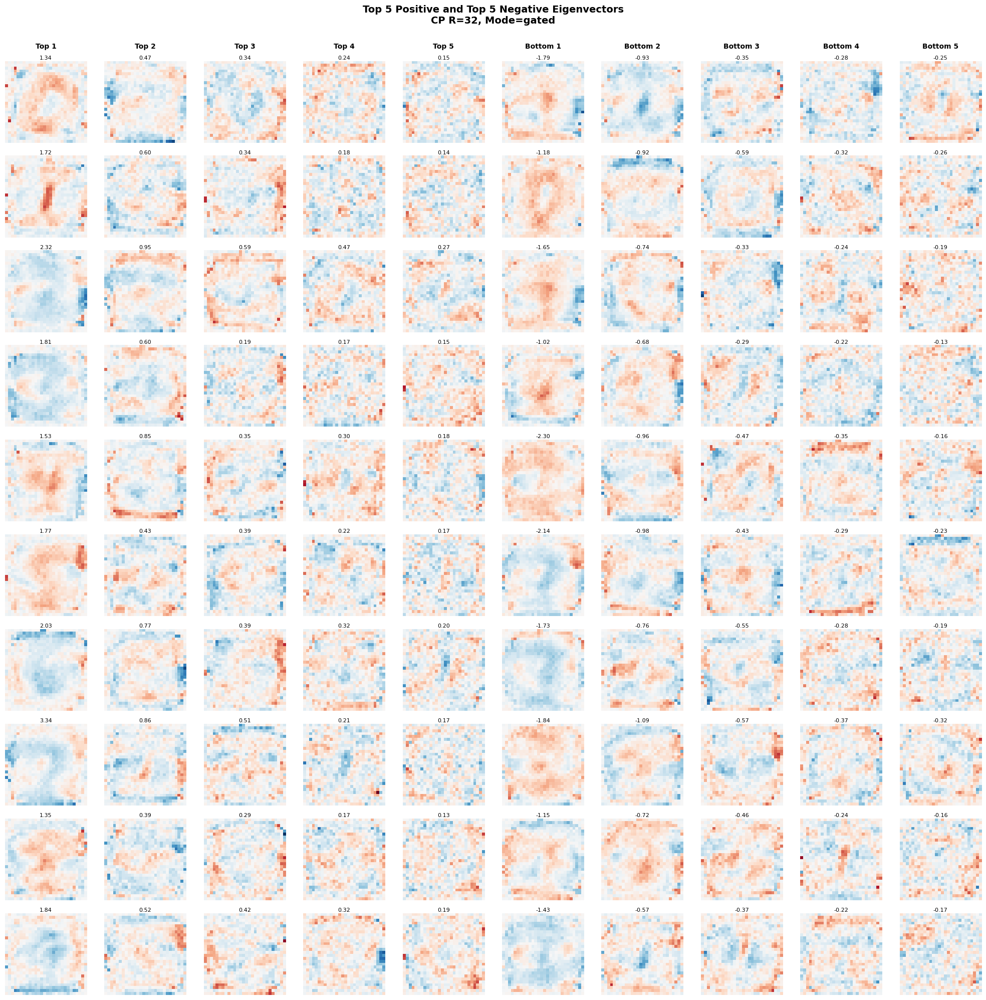

In [18]:
# Example: Visualize R=32, Mode=gated
visualize_eigenvectors_for_config(rank=32, mode='gated', checkpoint_data=checkpoint_data)


### 3.2 Visualize All Configurations

Generate visualizations for all available (rank, mode) combinations:



Visualizing: R=8, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r8_fixed.pdf


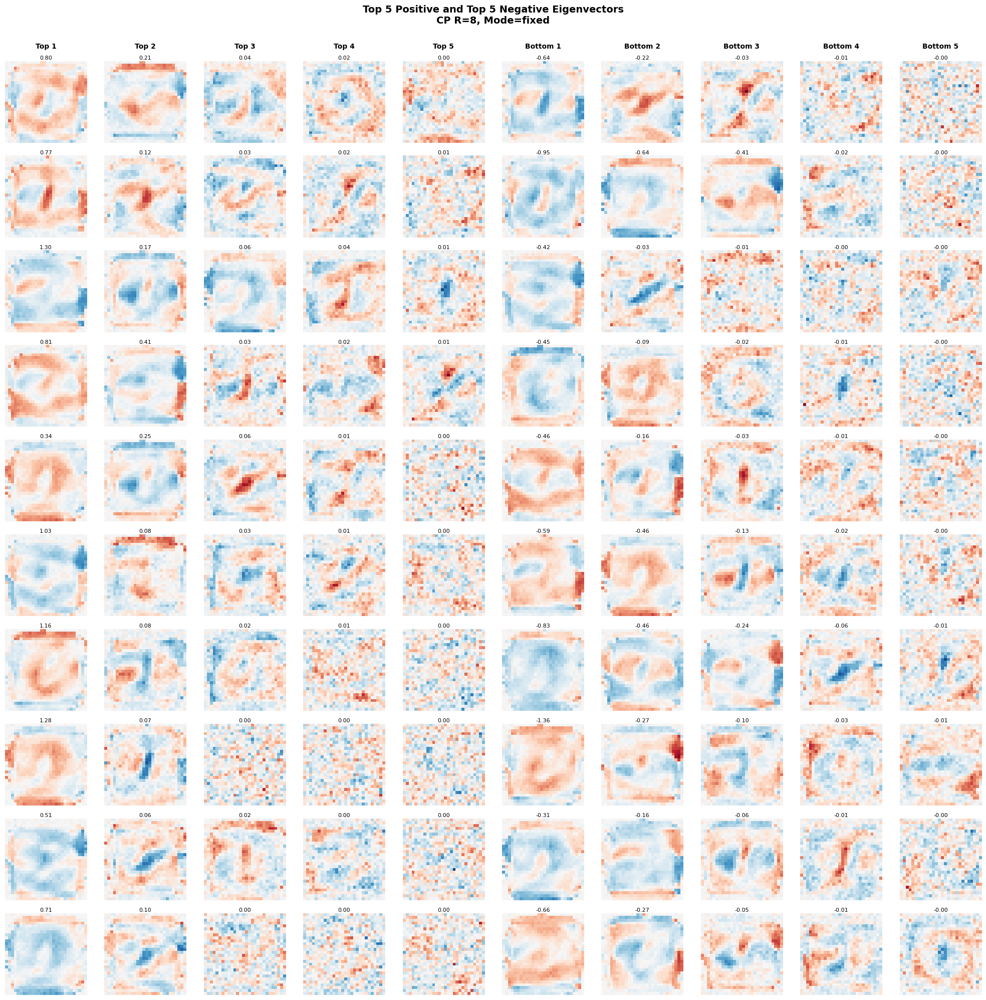


Visualizing: R=8, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r8_lambda.pdf


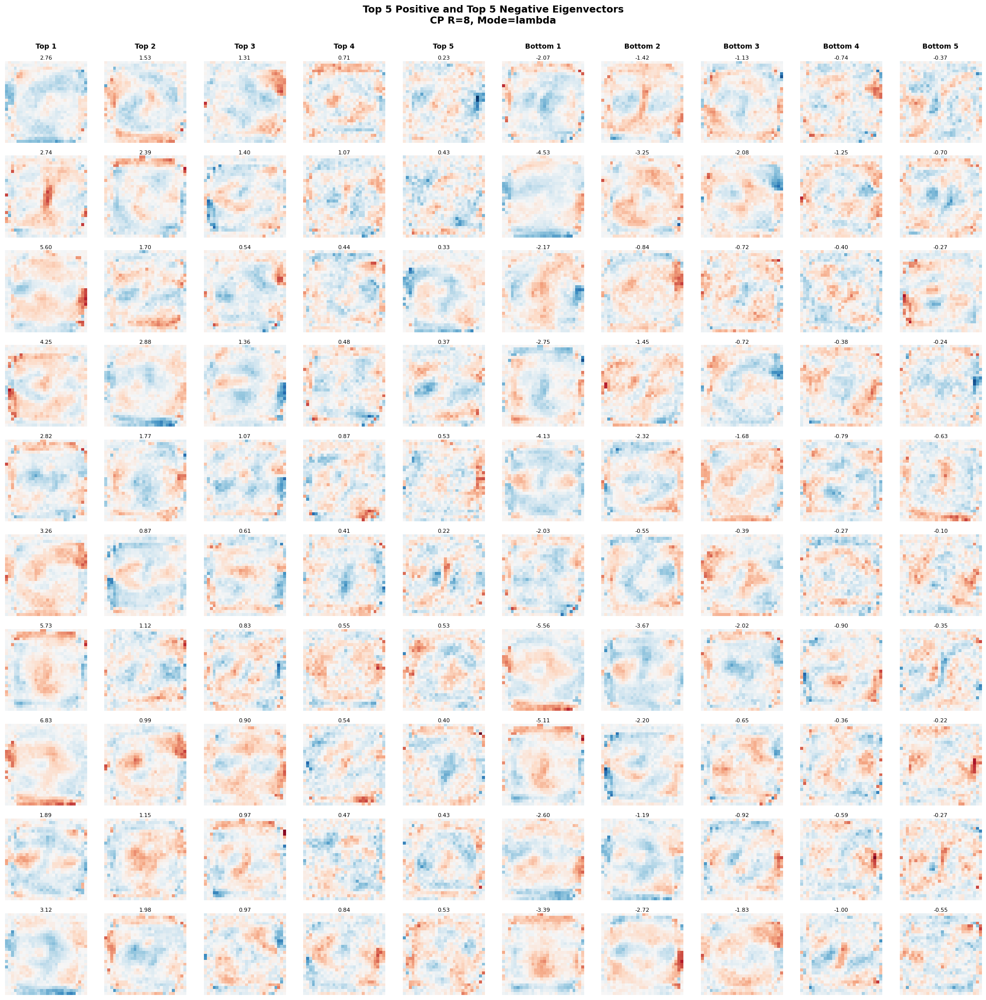


Visualizing: R=8, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r8_gated.pdf


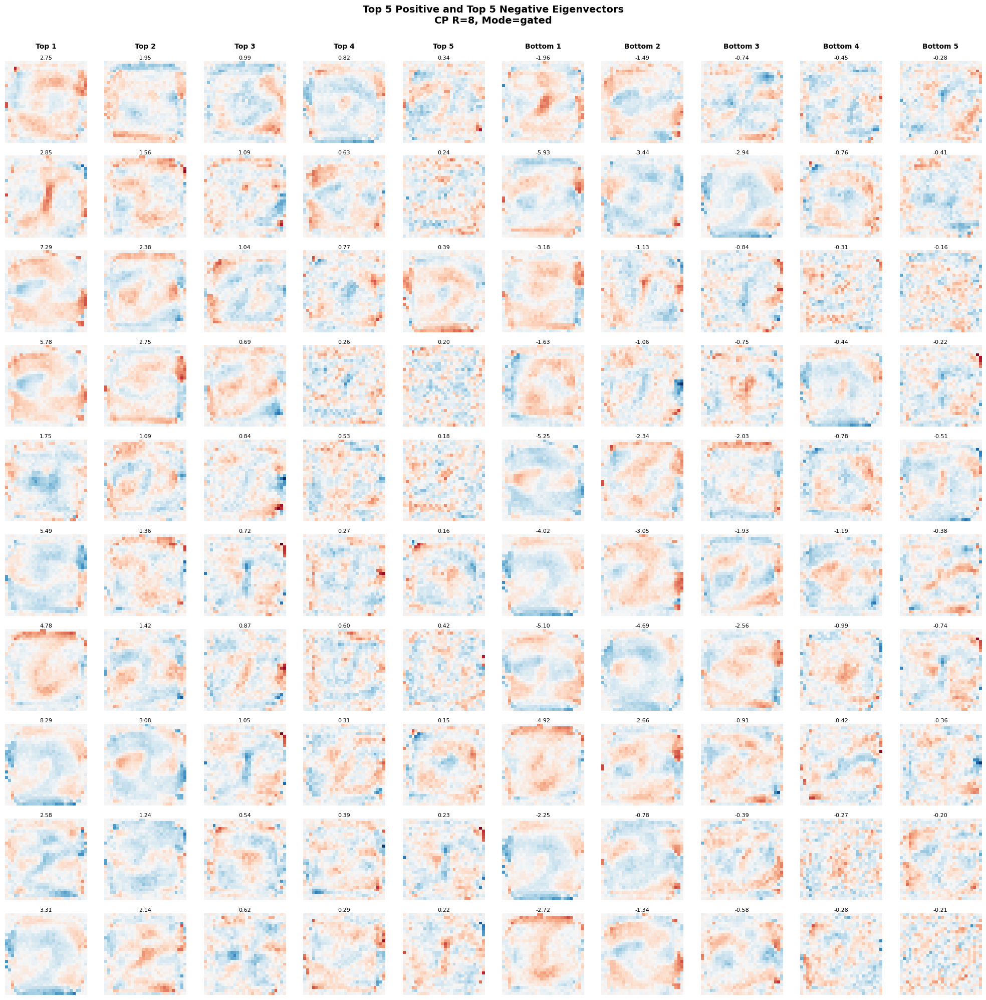


Visualizing: R=16, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r16_fixed.pdf


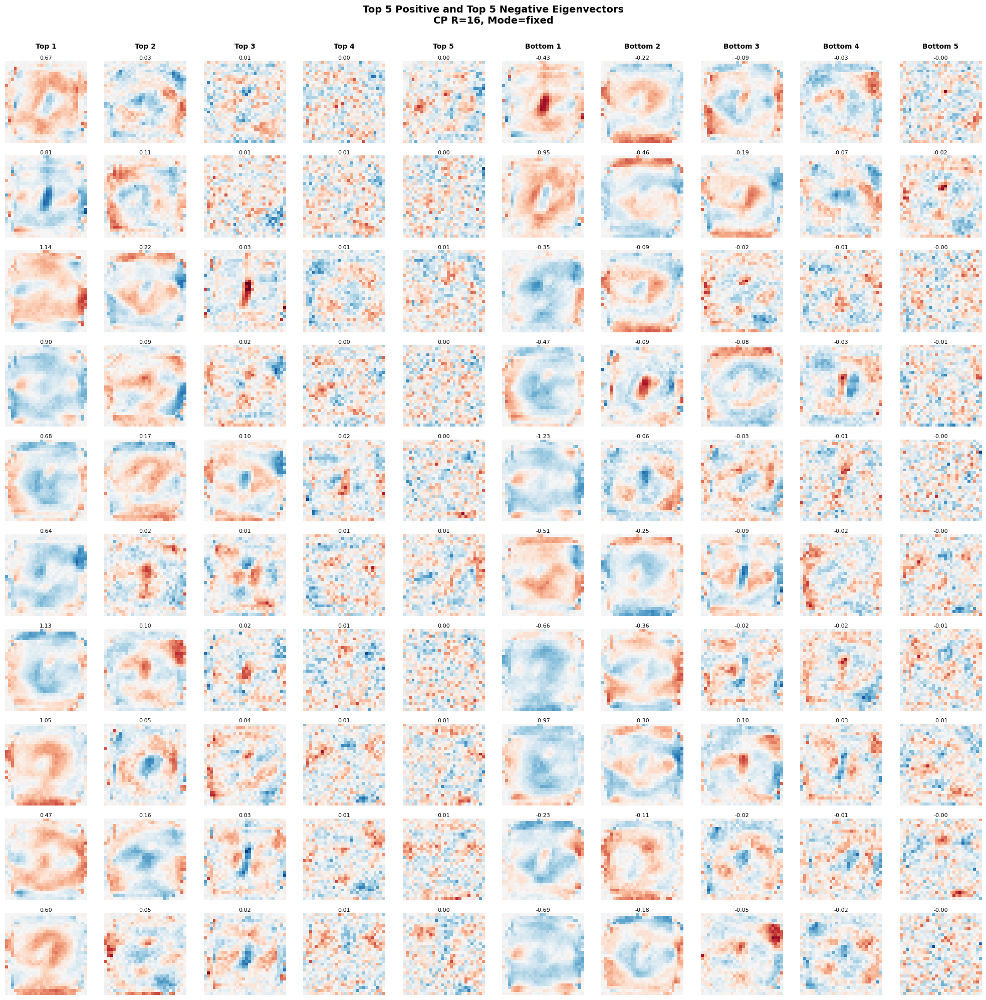


Visualizing: R=16, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r16_lambda.pdf


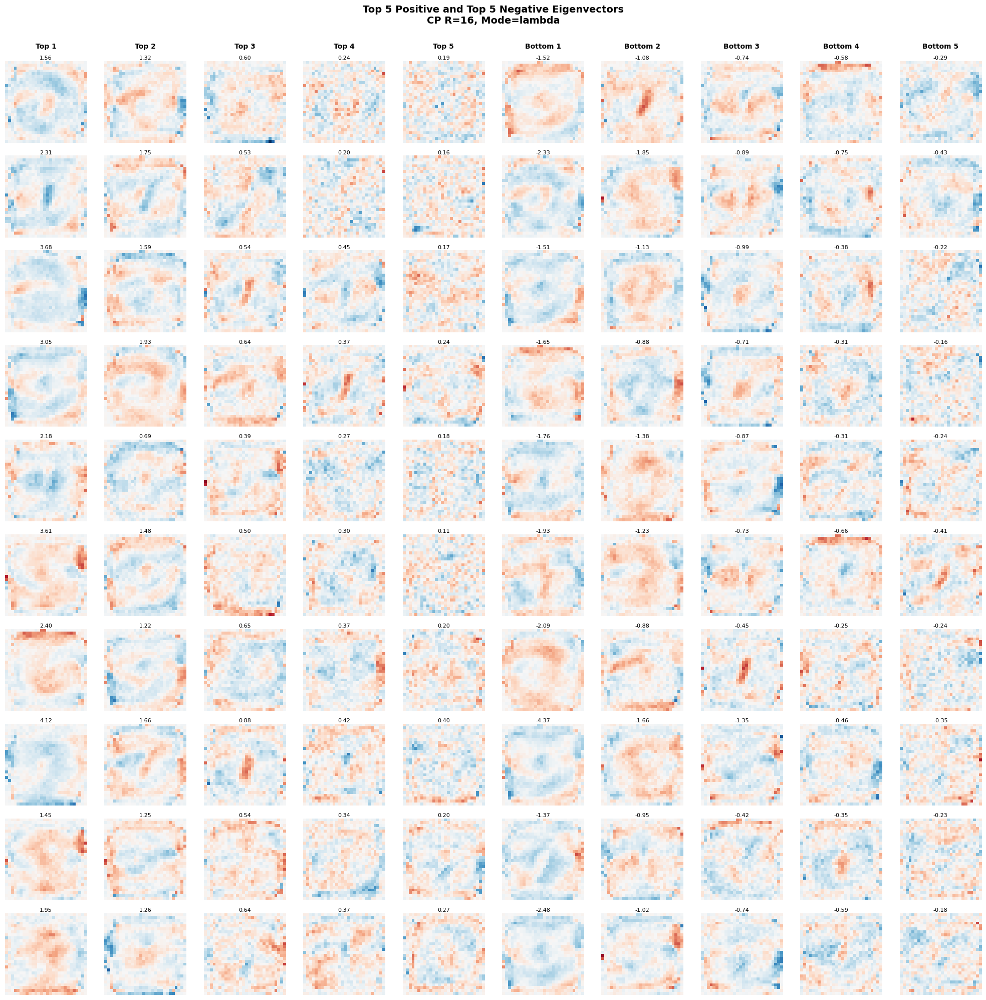


Visualizing: R=16, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r16_gated.pdf


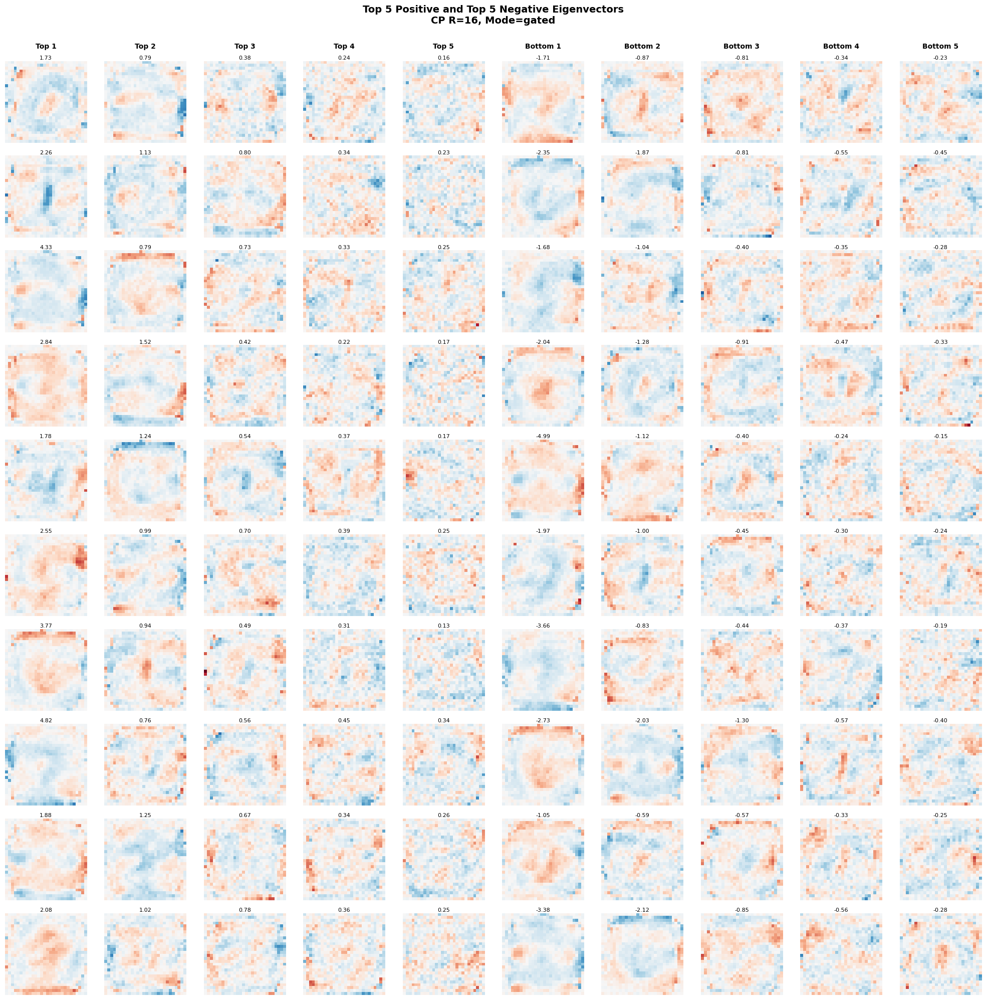


Visualizing: R=32, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r32_fixed.pdf


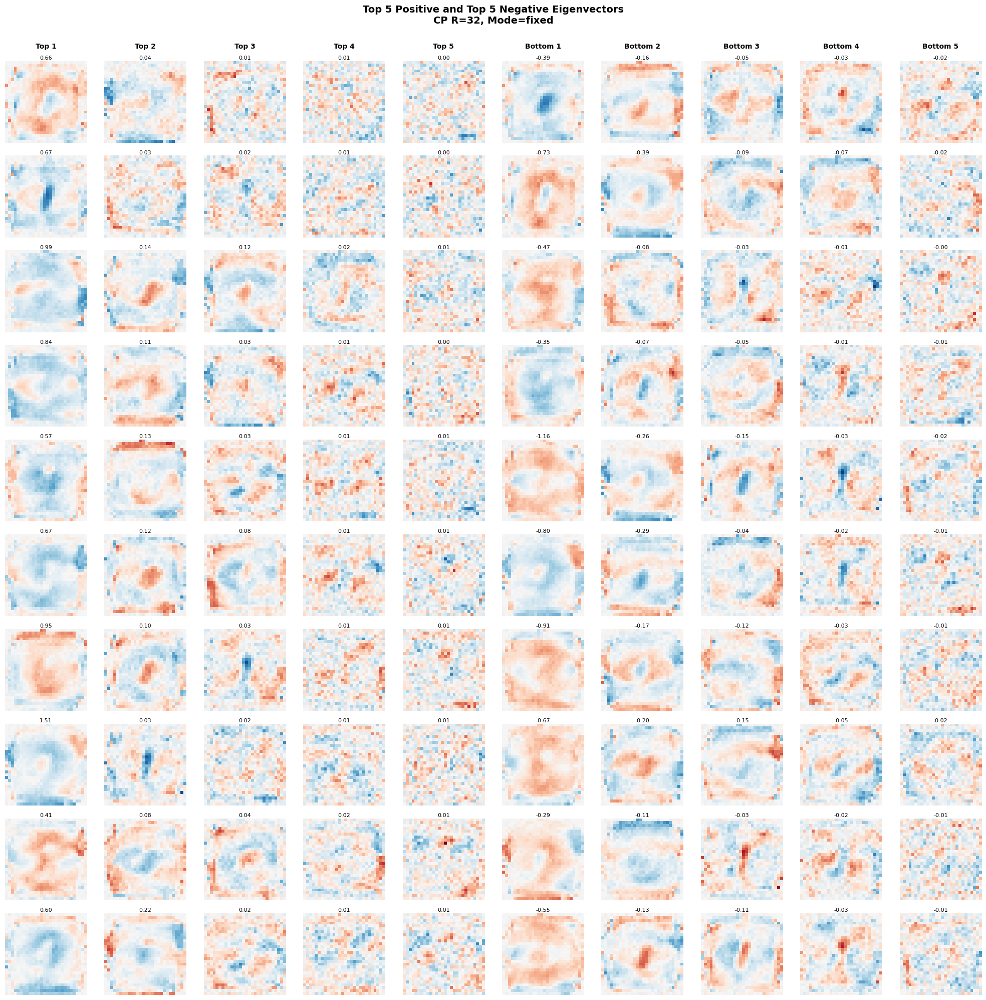


Visualizing: R=32, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r32_lambda.pdf


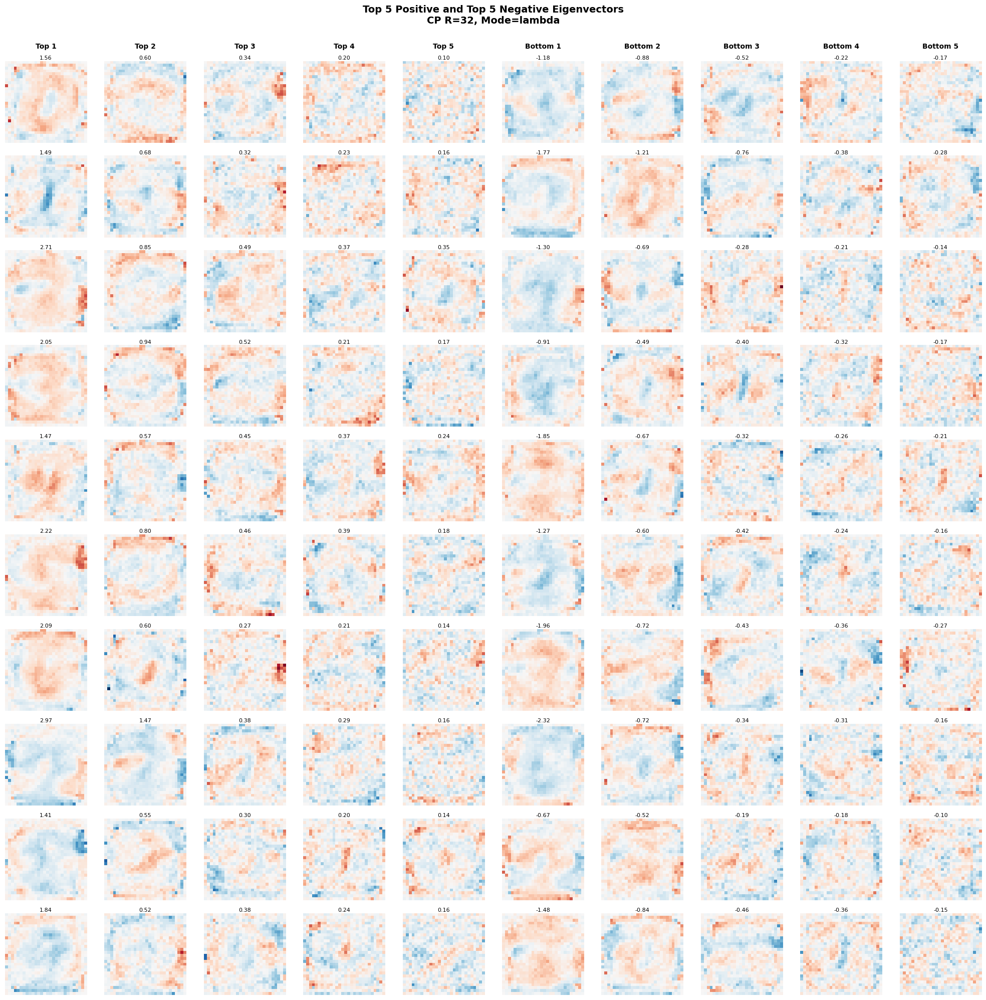


Visualizing: R=32, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r32_gated.pdf


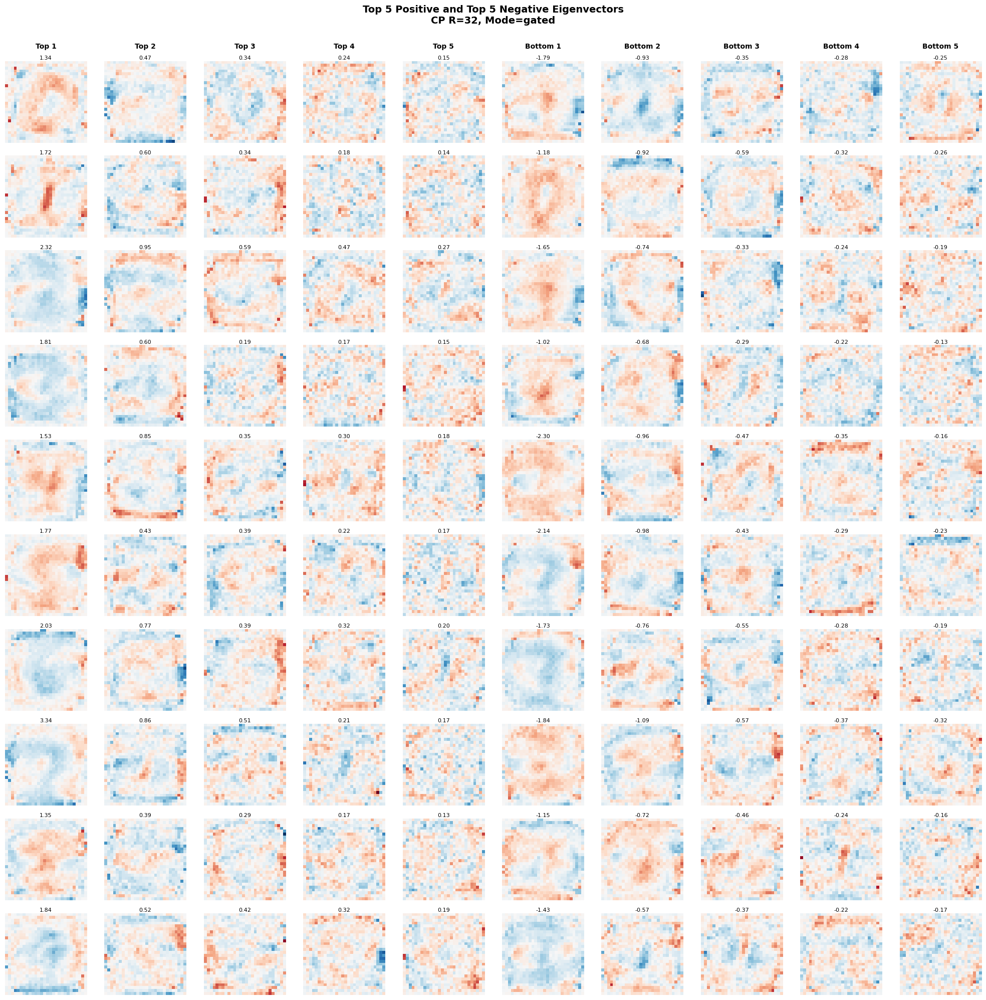


Visualizing: R=64, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r64_fixed.pdf


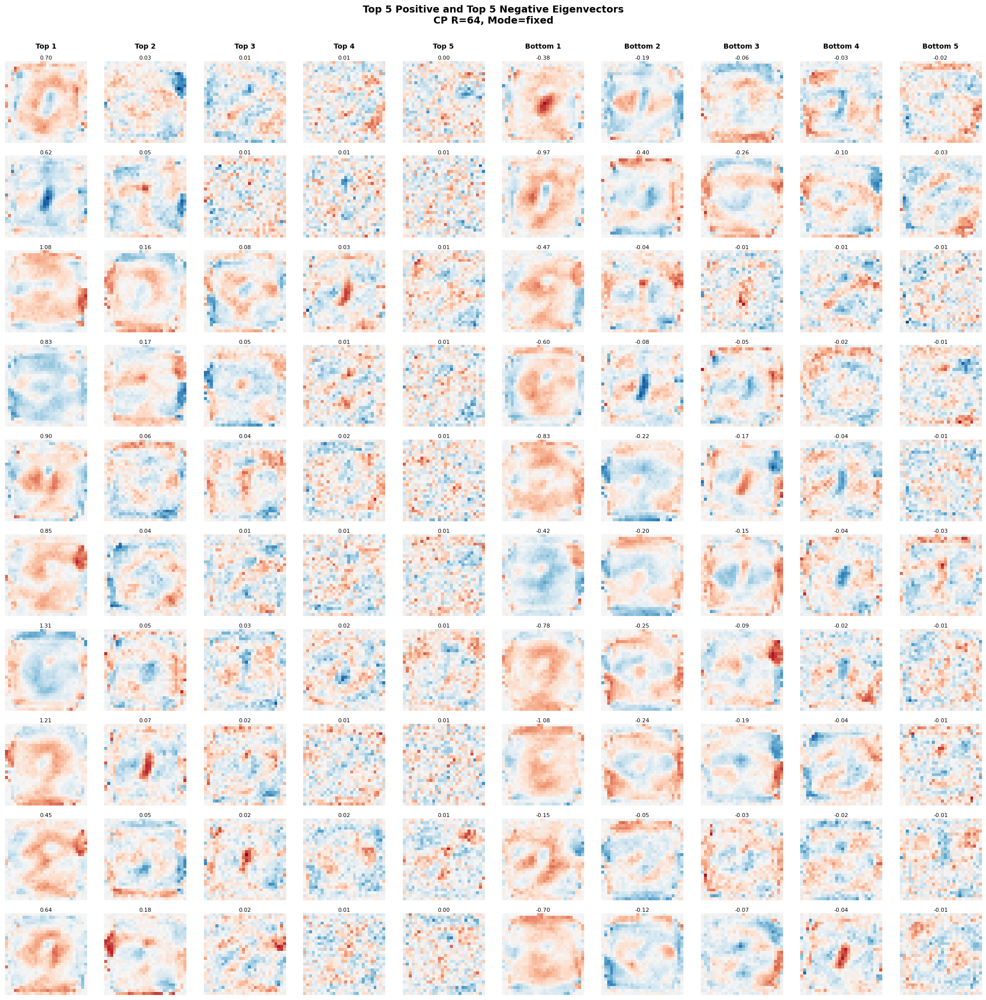


Visualizing: R=64, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r64_lambda.pdf


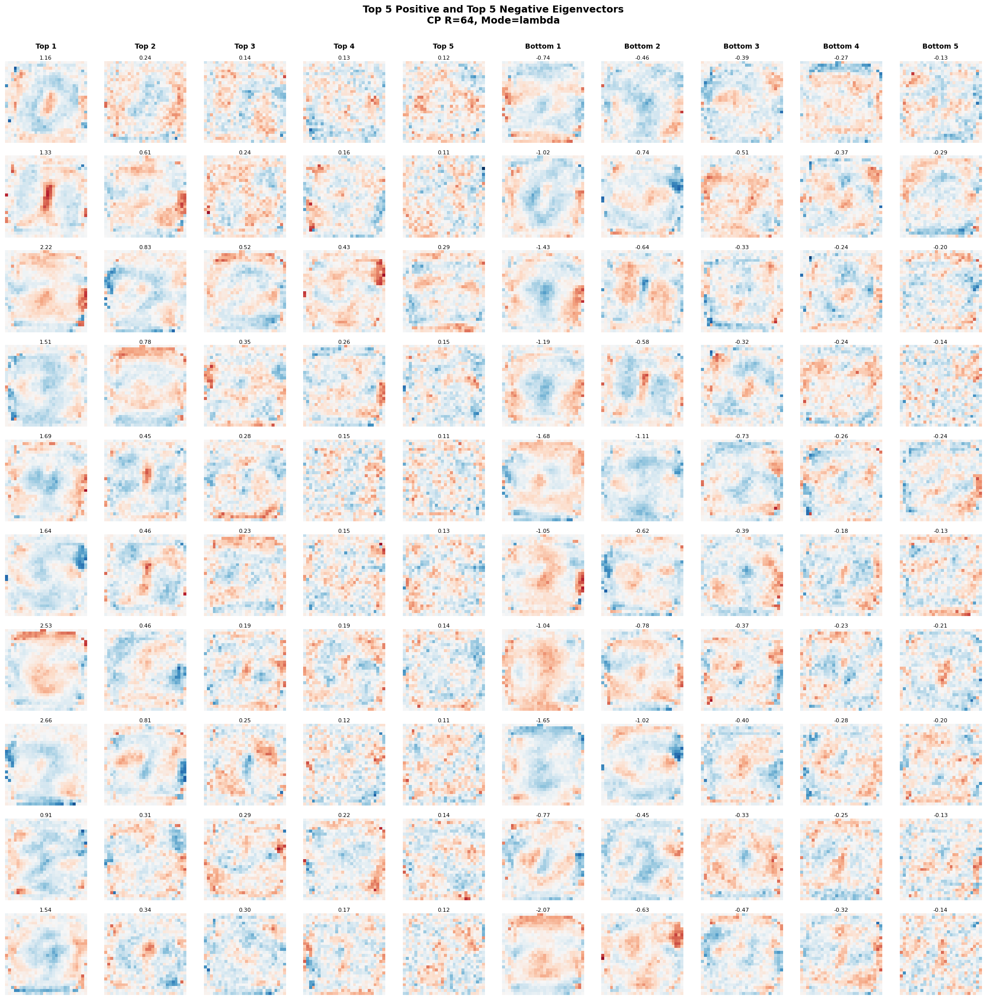


Visualizing: R=64, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r64_gated.pdf


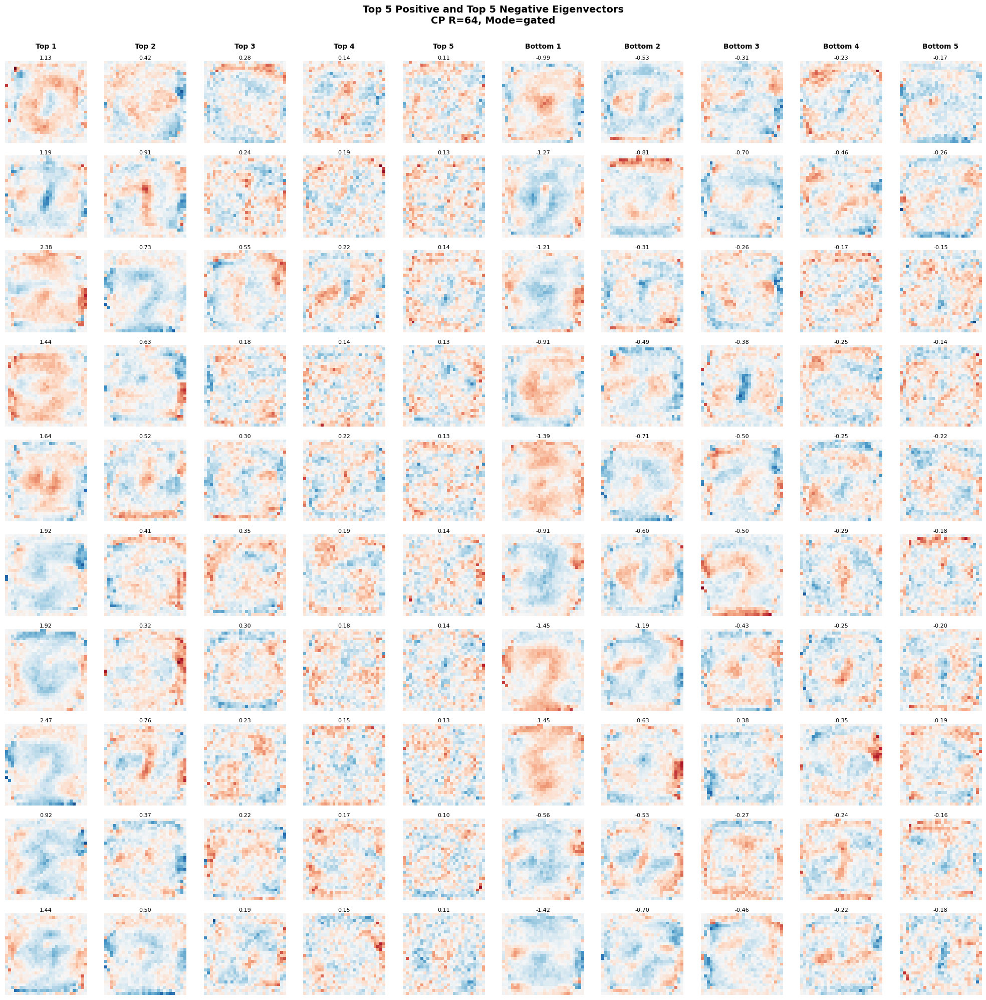


Visualizing: R=128, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r128_fixed.pdf


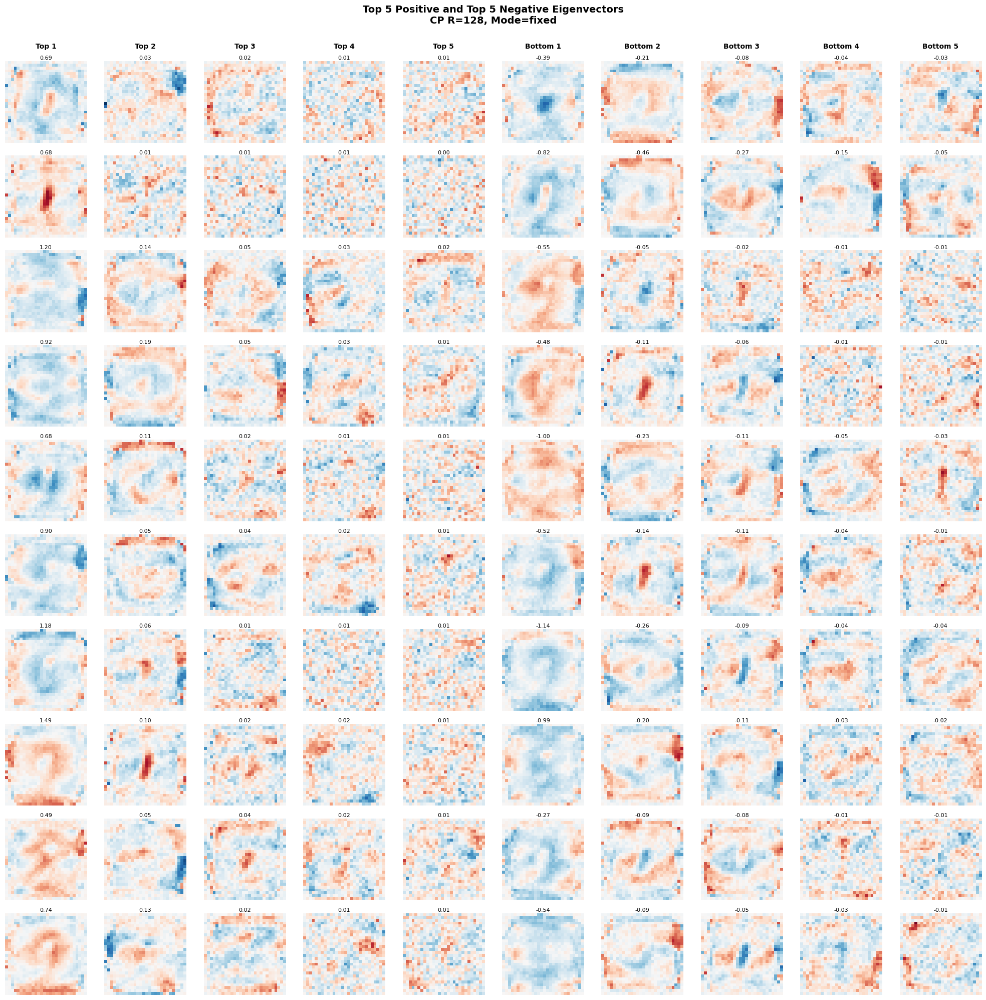


Visualizing: R=128, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r128_lambda.pdf


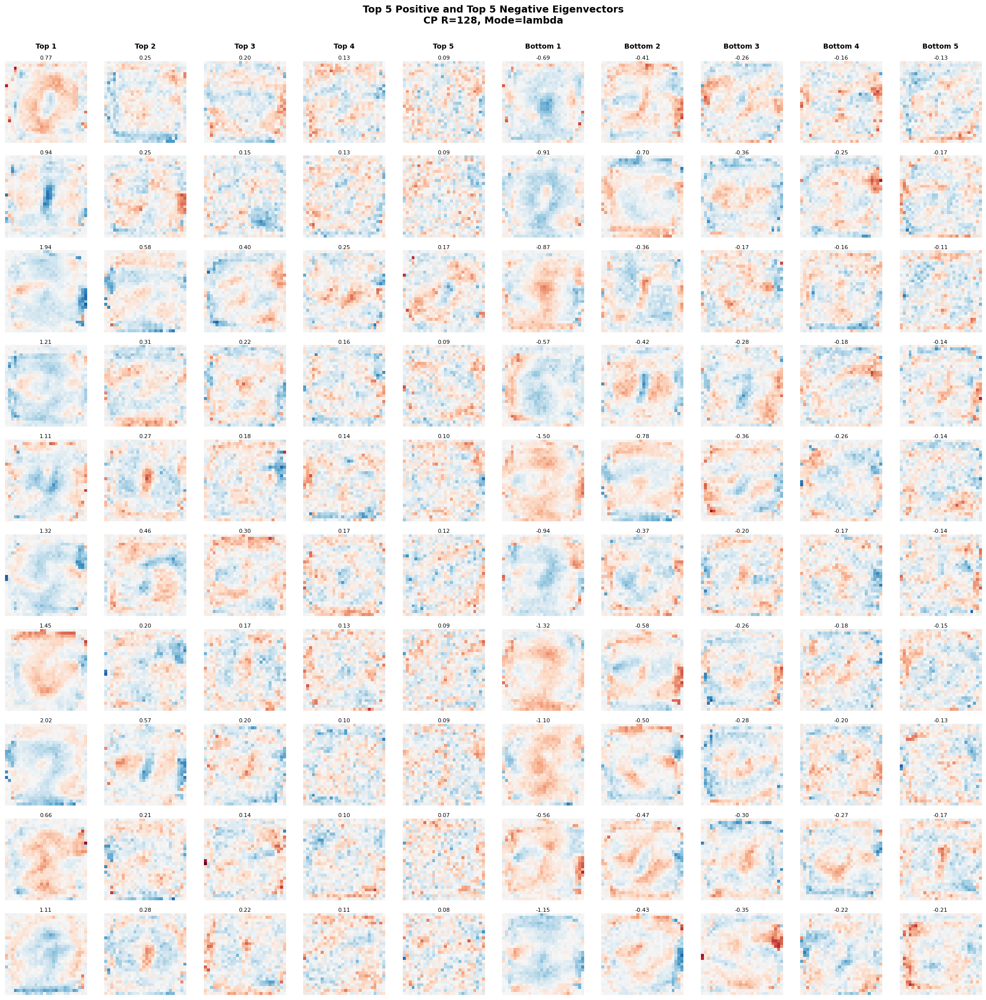


Visualizing: R=128, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r128_gated.pdf


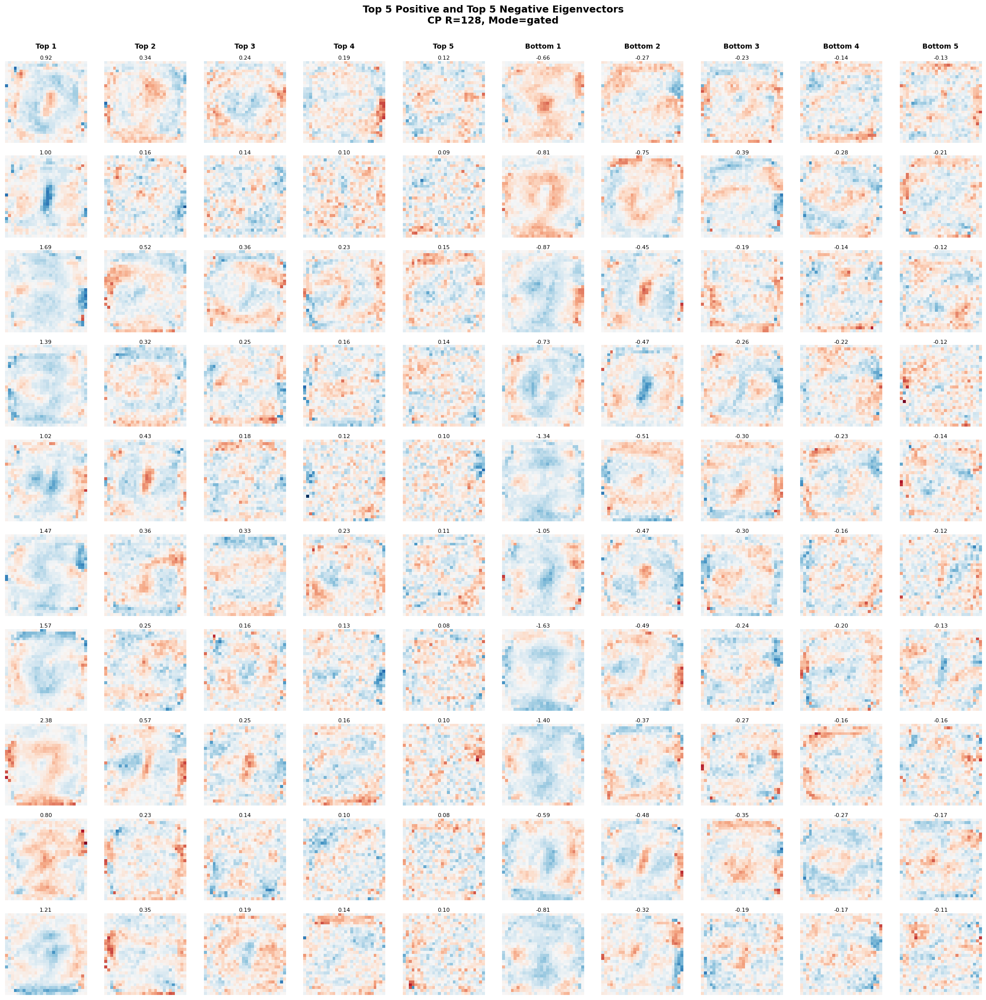


Visualizing: R=256, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r256_fixed.pdf


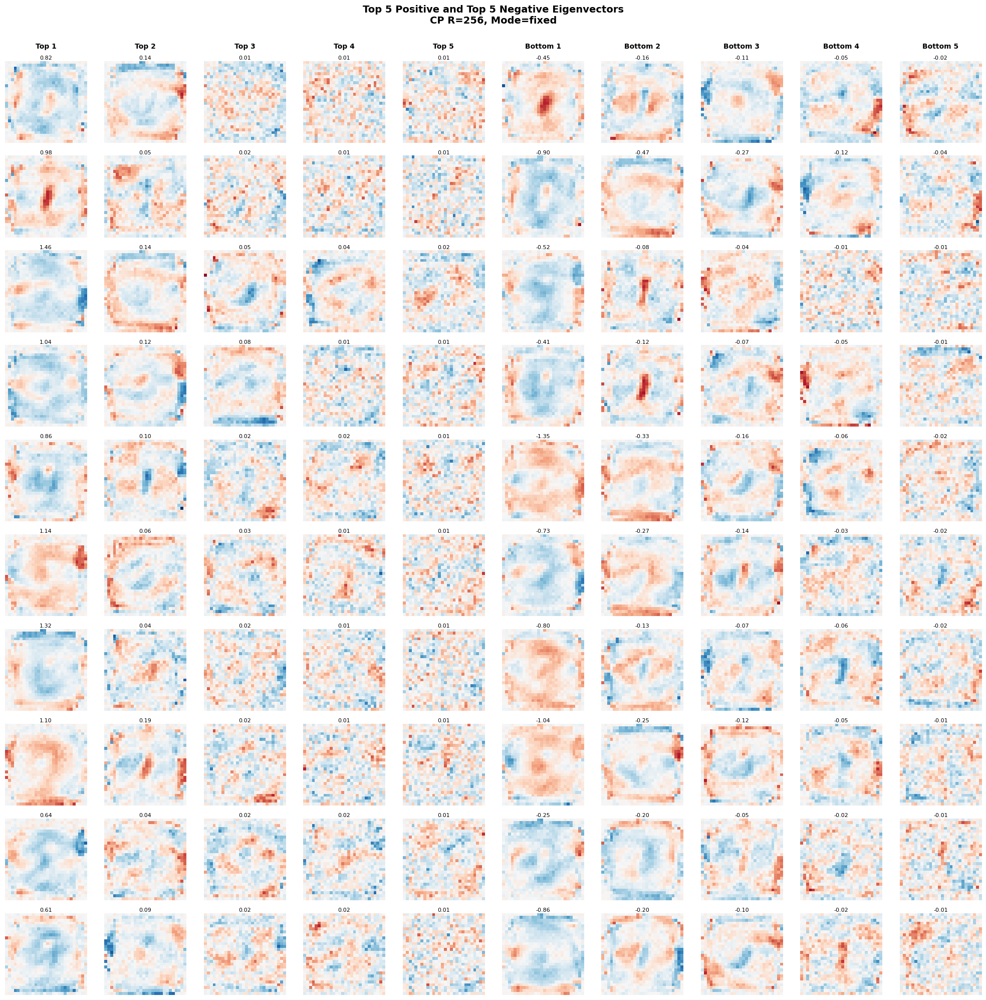


Visualizing: R=256, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r256_lambda.pdf


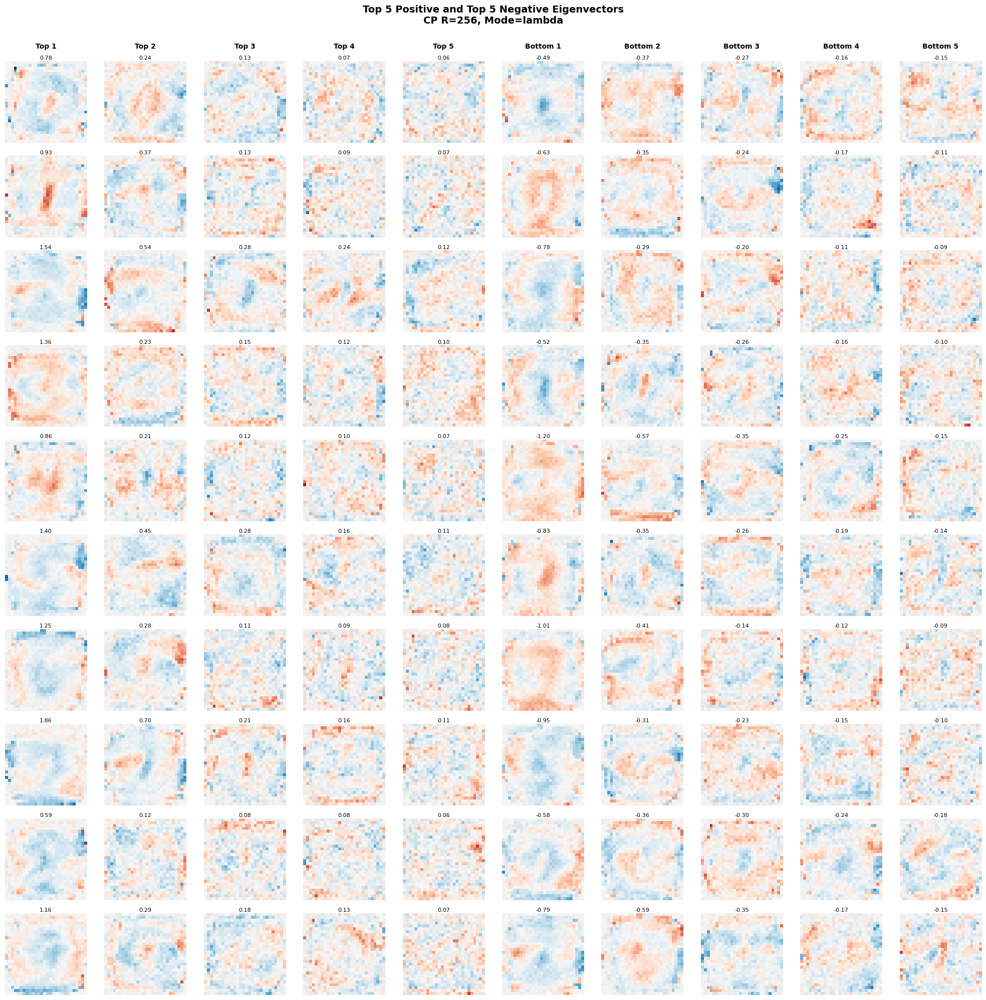


Visualizing: R=256, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r256_gated.pdf


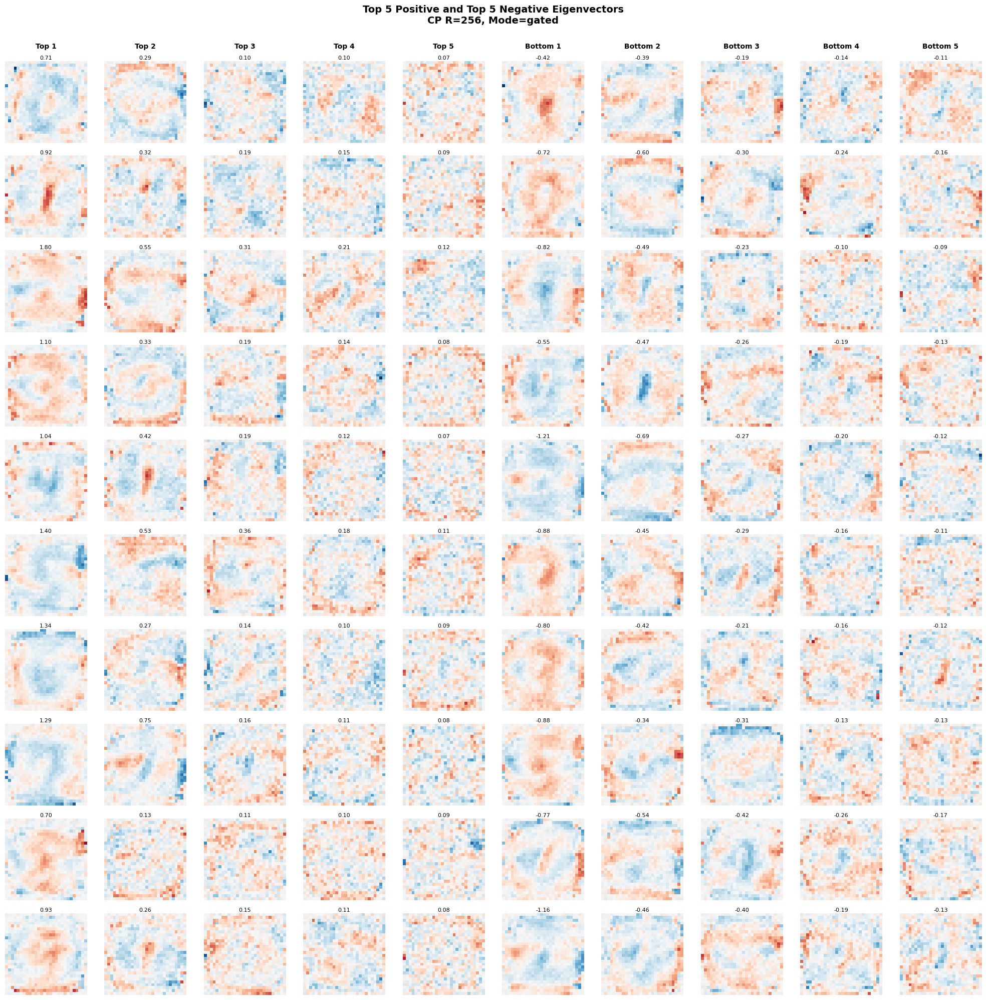


Visualizing: R=784, Mode=fixed
Saved: ../results/phase2/figures/eigenvectors_r784_fixed.pdf


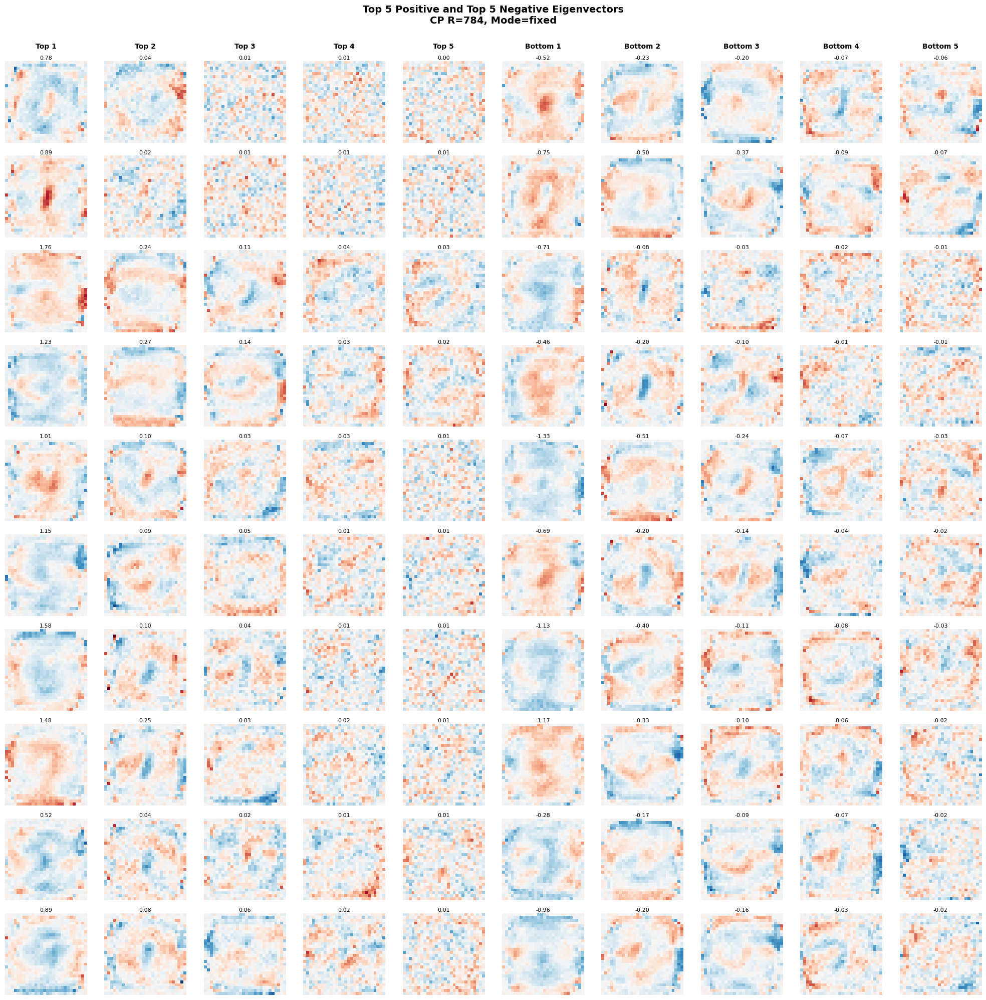


Visualizing: R=784, Mode=lambda
Saved: ../results/phase2/figures/eigenvectors_r784_lambda.pdf


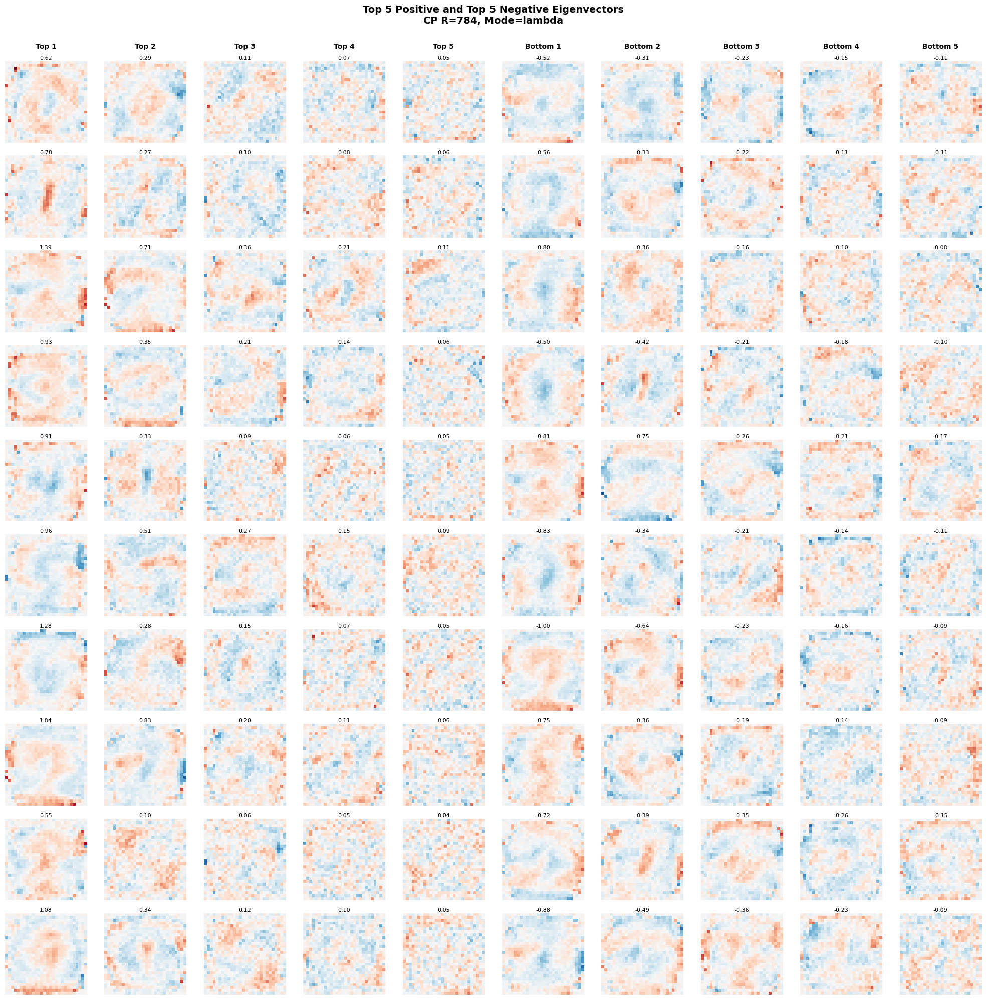


Visualizing: R=784, Mode=gated
Saved: ../results/phase2/figures/eigenvectors_r784_gated.pdf


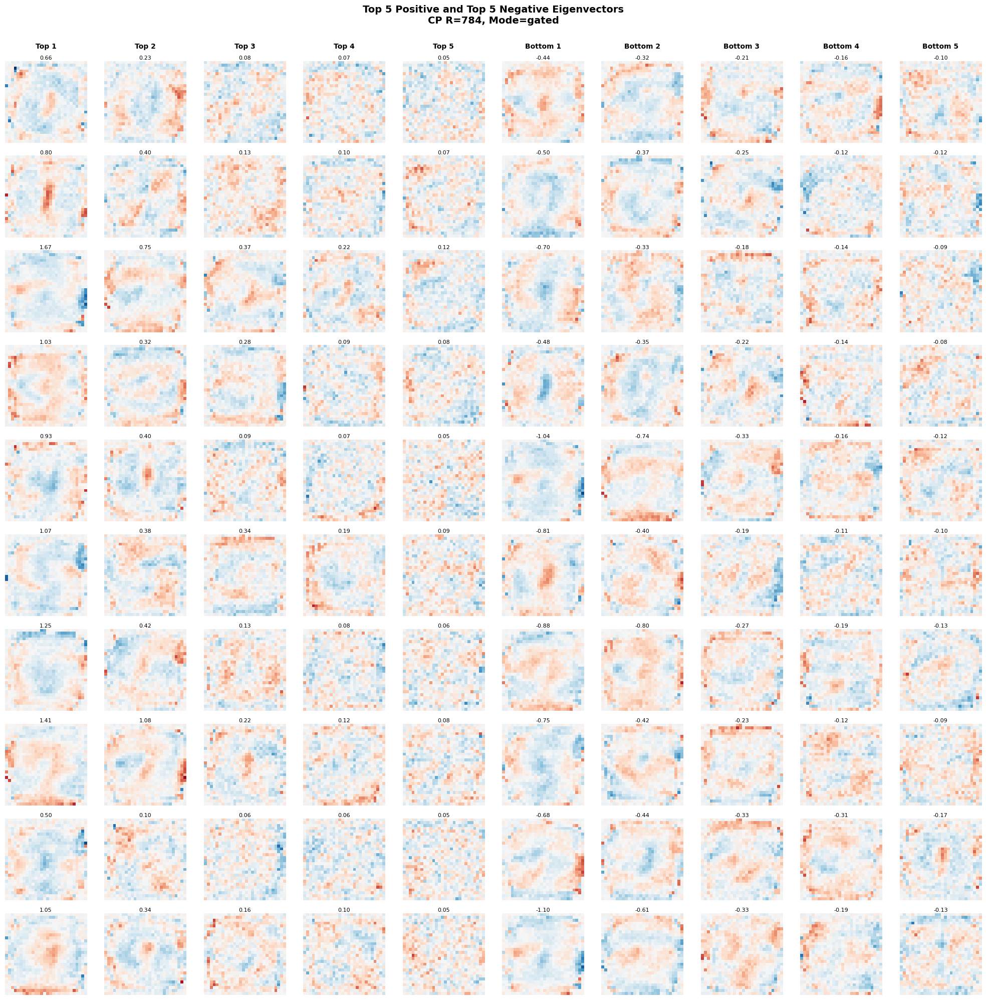

In [19]:
# Generate visualizations for all available checkpoints
for rank in RANKS:
    for mode in MODES:
        if (rank, mode) in checkpoint_data:
            print(f"\n{'='*60}")
            print(f"Visualizing: R={rank}, Mode={mode}")
            print(f"{'='*60}")
            visualize_eigenvectors_for_config(rank, mode, checkpoint_data)


## 4. Comparison Across Modes for Fixed Rank

Compare how different initialization modes affect eigenvectors for a specific rank:


Saved: ../results/phase2/figures/eigenvector_comparison_r32.pdf


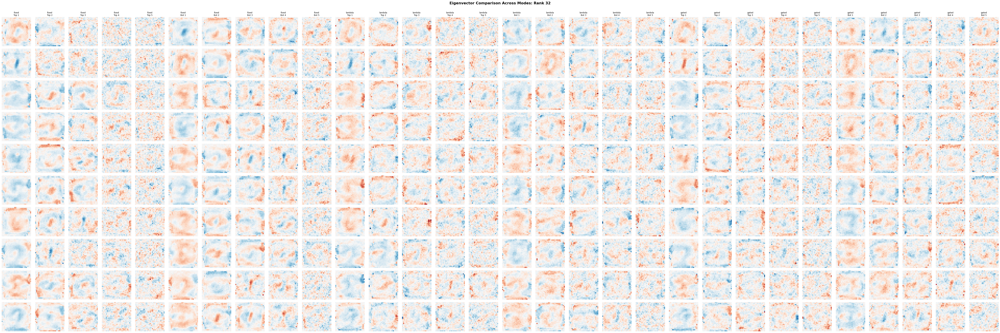

In [20]:
def compare_modes_for_rank(rank, checkpoint_data, n_top=5, n_bottom=5):
    """Compare eigenvectors across all modes for a fixed rank."""
    fig, axes = plt.subplots(10, 3 * (n_top + n_bottom), figsize=(6 * (n_top + n_bottom), 20))
    
    # Find global vmin/vmax
    all_vecs = []
    for mode in MODES:
        if (rank, mode) in checkpoint_data:
            checkpoint = checkpoint_data[(rank, mode)]
            eigenvalues = checkpoint['eigenvalues']
            eigenvectors = checkpoint['eigenvectors']
            top_indices, top_vecs, bottom_indices, bottom_vecs = get_top_eigenvectors(
                eigenvalues, eigenvectors, n_top=n_top, n_bottom=n_bottom
            )
            all_vecs.append(top_vecs)
            all_vecs.append(bottom_vecs)
    
    if len(all_vecs) == 0:
        print(f"No checkpoints found for rank {rank}")
        return
    
    vmax = max(v.abs().max().item() for v in all_vecs)
    vmin = -vmax
    
    for mode_idx, mode in enumerate(MODES):
        if (rank, mode) not in checkpoint_data:
            continue
            
        checkpoint = checkpoint_data[(rank, mode)]
        eigenvalues = checkpoint['eigenvalues']
        eigenvectors = checkpoint['eigenvectors']
        top_indices, top_vecs, bottom_indices, bottom_vecs = get_top_eigenvectors(
            eigenvalues, eigenvectors, n_top=n_top, n_bottom=n_bottom
        )
        
        col_start = mode_idx * (n_top + n_bottom)
        
        for class_idx in range(10):
            # Top eigenvectors
            for i in range(n_top):
                ax = axes[class_idx, col_start + i]
                vec = top_vecs[class_idx, i].detach().cpu().numpy().reshape(28, 28)
                ax.imshow(vec, cmap='RdBu', vmin=vmin, vmax=vmax)
                ax.axis('off')
                if class_idx == 0:
                    ax.set_title(f'{mode}\nTop {i+1}', fontsize=9, pad=5)
            
            # Bottom eigenvectors
            for i in range(n_bottom):
                ax = axes[class_idx, col_start + n_top + i]
                vec = bottom_vecs[class_idx, i].detach().cpu().numpy().reshape(28, 28)
                ax.imshow(vec, cmap='RdBu', vmin=vmin, vmax=vmax)
                ax.axis('off')
                if class_idx == 0:
                    ax.set_title(f'{mode}\nBot {i+1}', fontsize=9, pad=5)
            
            # Class labels on first mode
            if mode_idx == 0:
                axes[class_idx, 0].set_ylabel(f'Class {class_idx}', fontsize=10, 
                                             rotation=0, ha='right', va='center')
    
    plt.suptitle(f'Eigenvector Comparison Across Modes: Rank {rank}', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=(0, 0, 1, 0.99))
    
    save_path = FIGURE_DIR / f'eigenvector_comparison_r{rank}.pdf'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

# Example: Compare modes for R=32
compare_modes_for_rank(rank=32, checkpoint_data=checkpoint_data)
